In [1]:
import os
import warnings
import numpy as np 
import pandas as pd 
import seaborn as sns
import matplotlib.pyplot as plt

warnings.filterwarnings("ignore")

In [2]:
img = plt.imread('C:/Users/soham/Documents/MITAOE 24/TY Comp 22-23/Major Project/Dataset/dataset/Dataset/train/pizza/033.jpg')
dims = np.shape(img)
matrix = np.reshape(img, (dims[0] * dims[1], dims[2]))
print(np.shape(matrix))

(680900, 3)


Image shape ->  (619, 1100)
Color channels ->  3
Min color depth : 0, Max color depth 255


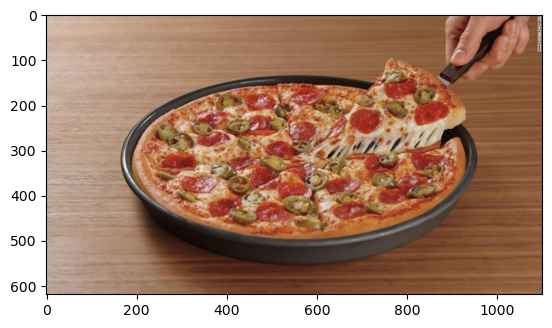

In [3]:
plt.imshow(img)
print("Image shape -> ",dims[:2])
print("Color channels -> ",dims[2])
print("Min color depth : {}, Max color depth {}".format(np.min(img),np.max(img)))

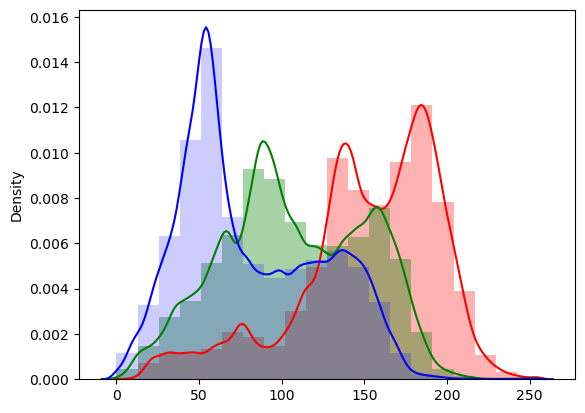

In [4]:
sns.distplot(matrix[:,0], bins=20,color="red",hist_kws=dict(alpha=0.3))
sns.distplot(matrix[:,1], bins=20,color="green",hist_kws=dict(alpha=0.35))
sns.distplot(matrix[:,2], bins=20,color="blue",hist_kws=dict(alpha=0.2))
plt.show()

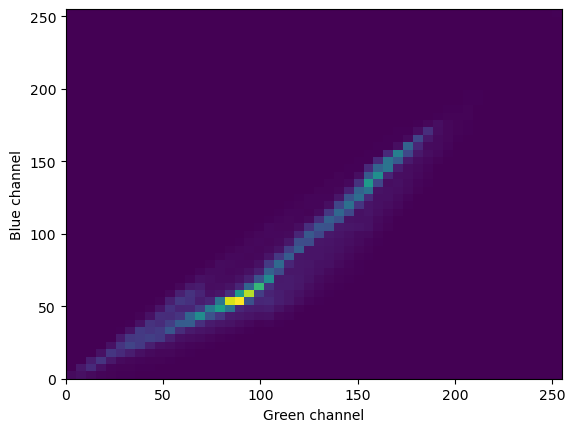

In [5]:
_ = plt.hist2d(matrix[:,1], matrix[:,2], bins=(50,50))
plt.xlabel('Green channel')
plt.ylabel('Blue channel')
plt.show()

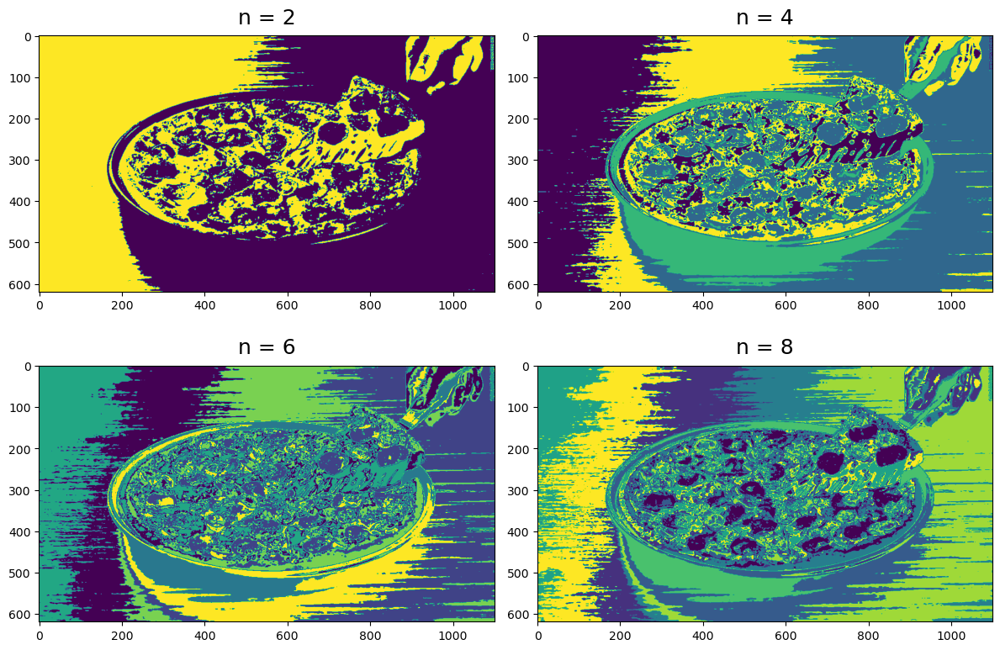

In [6]:
from sklearn import cluster
n_vals=[2,4,6,8]
plt.figure(1, figsize=(12, 8))

for subplot,n in enumerate(n_vals):
    kmeans=cluster.KMeans(n)
    clustered = kmeans.fit_predict(matrix)
    dims = np.shape(img)
    clustered_img = np.reshape(clustered, (dims[0], dims[1]))
    plt.subplot(2,2, subplot+1)
    plt.title("n = {}".format(n), pad = 10,size=18)
    plt.imshow(clustered_img)
    
plt.tight_layout()

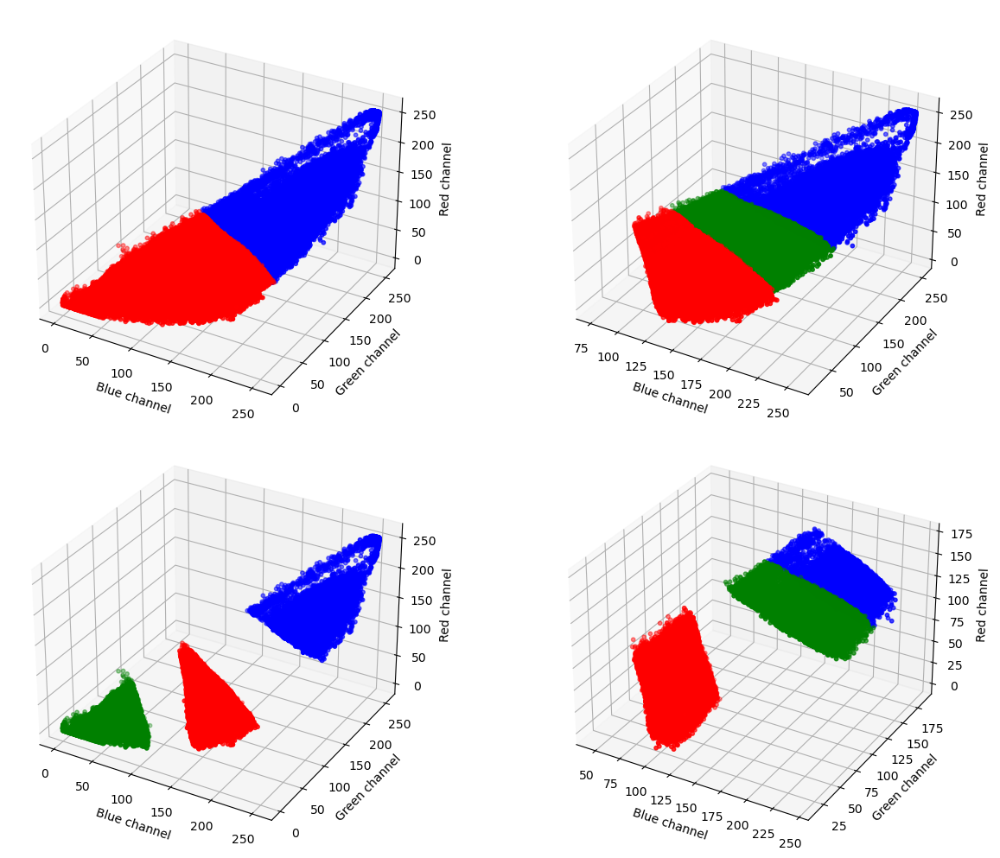

In [7]:
from mpl_toolkits.mplot3d import Axes3D

fig=plt.figure(figsize=(14,10))

ax = [fig.add_subplot(221, projection='3d'),
      fig.add_subplot(222, projection='3d'),
      fig.add_subplot(223, projection='3d'),
      fig.add_subplot(224, projection='3d')]

for plot_number,n in enumerate(n_vals):
    
    kmeans=cluster.KMeans(n)
    clustered = kmeans.fit_predict(matrix)
    x1, y1, z1 = [np.where(clustered == x)[0] for x in [0, 1, 2]]

    plot_vals = [('r', x1),
                 ('b', y1),
                 ('g', z1),
                 ]
    
    for c, channel in plot_vals:
        x = matrix[channel, 0]
        y = matrix[channel, 1]
        z = matrix[channel, 2]
        ax[plot_number].scatter(x, y, z, c=c,s=10)
    
    ax[plot_number].set_xlabel('Blue channel')
    ax[plot_number].set_ylabel('Green channel')
    ax[plot_number].set_zlabel('Red channel')

plt.tight_layout()


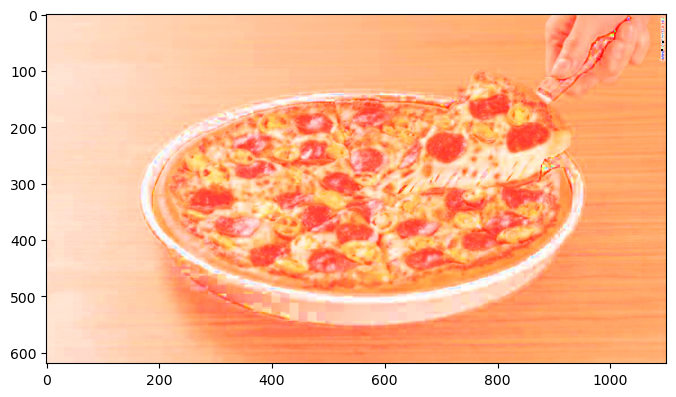

In [8]:
bnorm = np.zeros_like(matrix, dtype=np.float32)
max_range = np.max(matrix, axis=1)
bnorm = matrix / np.vstack((max_range, max_range, max_range)).T
bnorm_img = np.reshape(bnorm, (dims[0],dims[1],dims[2]))
plt.figure(figsize=(8,10))
plt.imshow(bnorm_img)
plt.show()

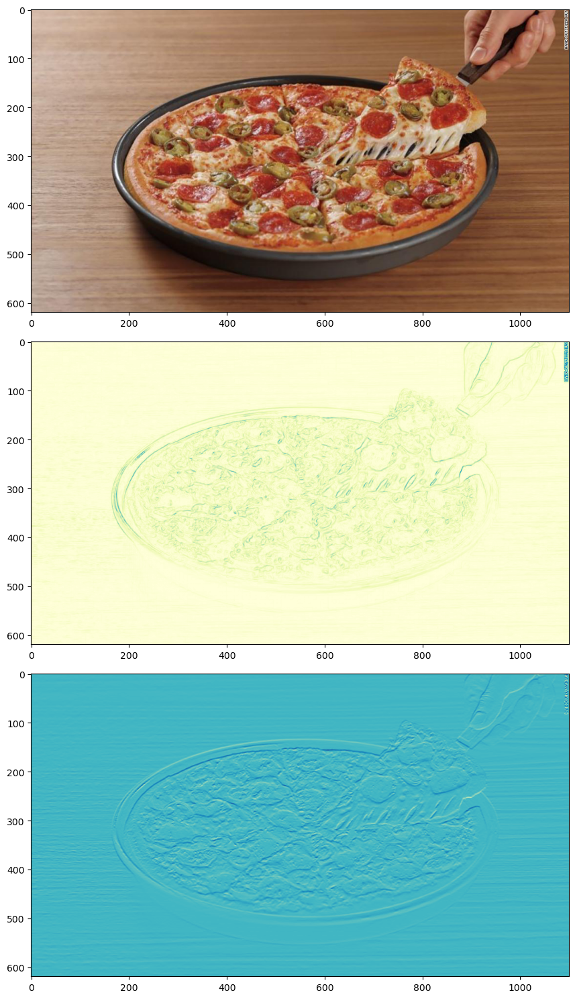

In [9]:
import skimage
from skimage.feature import greycomatrix, greycoprops
from skimage.filters import sobel
from skimage.filters import sobel_h

plt.figure(1,figsize=(20,15))
cmap="YlGnBu"
plt.subplot(3,1,1)
plt.imshow(img)

plt.subplot(3,1,2)
plt.imshow(sobel(img[:,:,2]),cmap=cmap)

plt.subplot(3,1,3)
plt.imshow(sobel_h(img[:,:,1]), cmap=cmap)

plt.tight_layout()

### Using Principle Component Analysis for extracting information from a high-dimensional space by projecting it into a lower-dimensional sub-space.

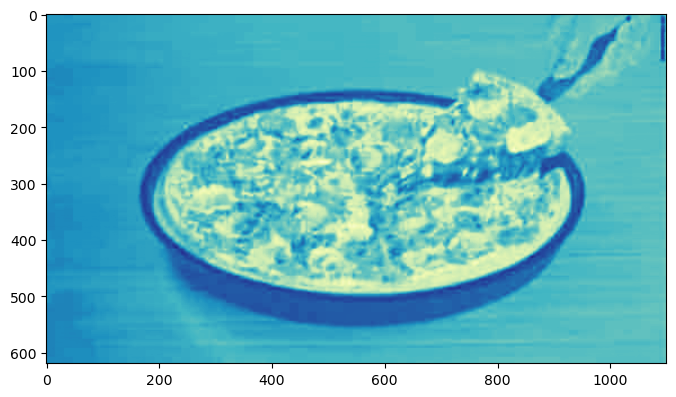

In [10]:
from sklearn.decomposition import PCA

pca = PCA(3)
pca.fit(matrix)
img_pca = pca.transform(matrix)
img_pca = np.reshape(img_pca, (dims[0], dims[1], dims[2]))

fig = plt.figure(figsize=(8, 8))
plt.imshow(img_pca[:,:,1], cmap=cmap)

### Checking the number of images in each class

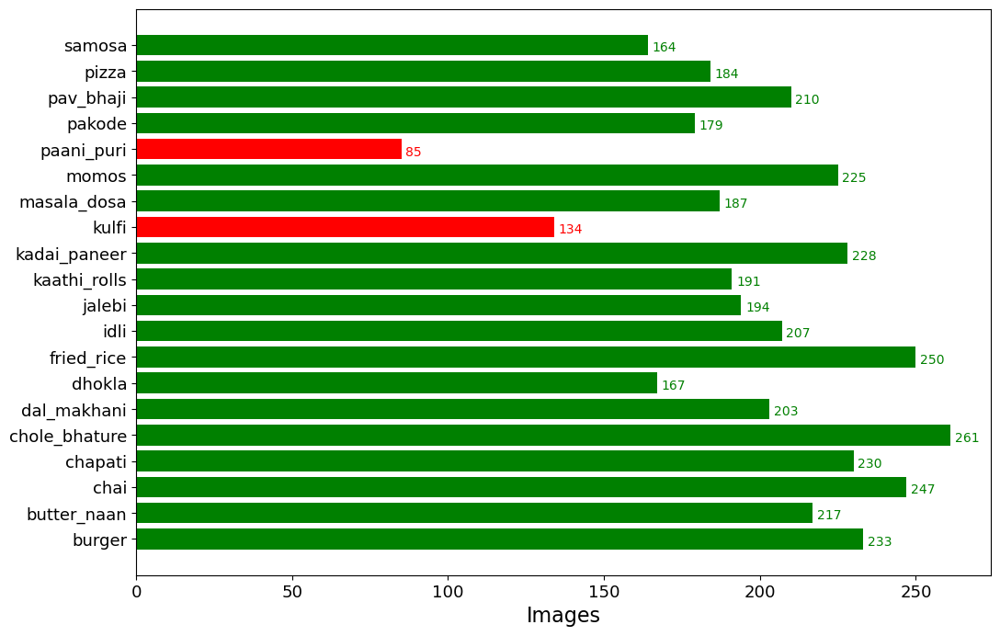

In [11]:
main='C:/Users/soham/Documents/MITAOE 24/TY Comp 22-23/Major Project/Dataset/dataset/Dataset/train/'

data=dict()

for i in os.listdir(main):
    sub_dir=os.path.join(main,i)
    count=len(os.listdir(sub_dir))
    data[i]=count
    
  
keys = data.keys()
values = data.values()

colors=["red" if x<= 150 else "green" for x in values]

fig, ax = plt.subplots(figsize=(12,8))
y_pos=np.arange(len(values))
plt.barh(y_pos,values,align='center',color=colors)
for i, v in enumerate(values):
    ax.text(v+1.4, i-0.25, str(v), color=colors[i])
ax.set_yticks(y_pos)
ax.set_yticklabels(keys)
ax.set_xlabel('Images',fontsize=16)
plt.xticks(color='black',fontsize=13)
plt.yticks(fontsize=13)
plt.show()


### Perfoming Data Augmentation. Data augmentation helps with classes not having enough training examples by increasing the amount of relevant data in the dataset.


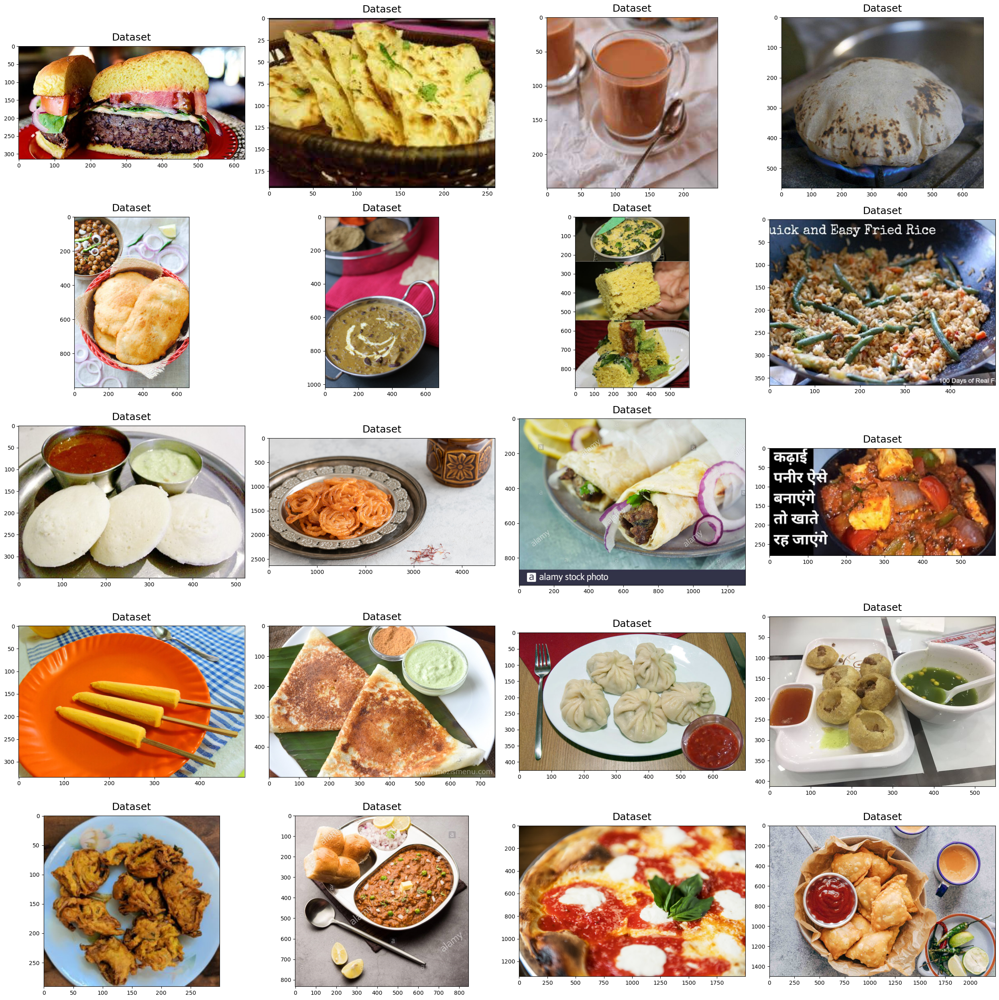

In [12]:
import random

train_folder = "C:/Users/soham/Documents/MITAOE 24/TY Comp 22-23/Major Project/Dataset/dataset/Dataset/train"
images = []

for food_folder in sorted(os.listdir(train_folder)):
    food_items = os.listdir(train_folder + '/' + food_folder)
    food_selected = np.random.choice(food_items)
    images.append(os.path.join(train_folder,food_folder,food_selected))
                                     
fig=plt.figure(1, figsize=(25, 25))

for subplot,image_ in enumerate(images):
    category=image_.split('/')[-2]
    imgs = plt.imread(image_)
    a,b,c=imgs.shape
    fig=plt.subplot(5, 4, subplot+1)
    fig.set_title(category, pad = 10,size=18)
    plt.imshow(imgs)
    
plt.tight_layout()

In [13]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

n_classes = 20
batch_size = 32
img_width, img_height = 299, 299

train_data_dir = 'C:/Users/soham/Documents/MITAOE 24/TY Comp 22-23/Major Project/Dataset/dataset/Dataset/train'

# Data Augmentation with ImageDataGenerator
train_datagen = ImageDataGenerator(
    rescale=1. / 255,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True)

train_generator = train_datagen.flow_from_directory(
    train_data_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical')

val_data_dir = 'C:/Users/soham/Documents/MITAOE 24/TY Comp 22-23/Major Project/Dataset/dataset/Dataset/val'

val_datagen = ImageDataGenerator(rescale=1. / 255)

val_generator = val_datagen.flow_from_directory(
    val_data_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical')

Found 3996 images belonging to 20 classes.
Found 1250 images belonging to 20 classes.


### Giving indices to the classes

In [14]:
class_map = train_generator.class_indices
class_map

{'burger': 0,
 'butter_naan': 1,
 'chai': 2,
 'chapati': 3,
 'chole_bhature': 4,
 'dal_makhani': 5,
 'dhokla': 6,
 'fried_rice': 7,
 'idli': 8,
 'jalebi': 9,
 'kaathi_rolls': 10,
 'kadai_paneer': 11,
 'kulfi': 12,
 'masala_dosa': 13,
 'momos': 14,
 'paani_puri': 15,
 'pakode': 16,
 'pav_bhaji': 17,
 'pizza': 18,
 'samosa': 19}

### Training the model

In [15]:
from tensorflow.keras.applications.inception_v3 import InceptionV3
# from tensorflow.keras.layers import Convolution2D, MaxPooling2D, ZeroPadding2D, GlobalAveragePooling2D, AveragePooling2D
# from tensorflow.keras.layers import Dense, Dropout, Activation, Flatten

from tensorflow.keras.layers import GlobalAveragePooling2D
from tensorflow.keras.layers import Dense, Dropout

from tensorflow.keras import regularizers
from tensorflow.keras.regularizers import l2

from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.callbacks import ModelCheckpoint, CSVLogger

nb_train_samples = 3583 
nb_validation_samples = 1089

inception = InceptionV3(weights='imagenet', include_top=False)
x = inception.output
x = GlobalAveragePooling2D()(x)
x = Dense(128,activation='relu')(x)
x = Dropout(0.2)(x)

predictions = Dense(n_classes,kernel_regularizer=regularizers.l2(0.005), activation='softmax')(x)

model = Model(inputs=inception.input, outputs=predictions)
model.compile(optimizer=SGD(lr=0.0001, momentum=0.9), loss='categorical_crossentropy', metrics=['accuracy'])
checkpointer = ModelCheckpoint(filepath='v1_inceptionV3', verbose=1, save_best_only=True)
csv_logger = CSVLogger('history_v1_inceptionV3.log')

history = model.fit_generator(train_generator,
                    steps_per_epoch = nb_train_samples // batch_size,
                    validation_data=val_generator,
                    validation_steps=nb_validation_samples // batch_size,
                    epochs=20,
                    initial_epoch=1,
                    verbose=1,
                    callbacks=[csv_logger, checkpointer])

Epoch 2/20
111/111 [==============================] - ETA: 0s - loss: 1.2892 - accuracy: 0.6785 
Epoch 2: val_loss improved from inf to 1.90151, saving model to v1_inceptionV3


INFO:tensorflow:Assets written to: v1_inceptionV3\assets


INFO:tensorflow:Assets written to: v1_inceptionV3\assets


111/111 [==============================] - 1392s 12s/step - loss: 1.2892 - accuracy: 0.6785 - val_loss: 1.9015 - val_accuracy: 0.4789
Epoch 3/20
111/111 [==============================] - ETA: 0s - loss: 0.5697 - accuracy: 0.8715 
Epoch 3: val_loss improved from 1.90151 to 0.81878, saving model to v1_inceptionV3


INFO:tensorflow:Assets written to: v1_inceptionV3\assets


INFO:tensorflow:Assets written to: v1_inceptionV3\assets


111/111 [==============================] - 1375s 12s/step - loss: 0.5697 - accuracy: 0.8715 - val_loss: 0.8188 - val_accuracy: 0.8051
Epoch 4/20
111/111 [==============================] - ETA: 0s - loss: 0.4029 - accuracy: 0.9166 
Epoch 4: val_loss did not improve from 0.81878
111/111 [==============================] - 1374s 12s/step - loss: 0.4029 - accuracy: 0.9166 - val_loss: 0.9911 - val_accuracy: 0.7610
Epoch 5/20
111/111 [==============================] - ETA: 0s - loss: 0.3434 - accuracy: 0.9312 
Epoch 5: val_loss did not improve from 0.81878
111/111 [==============================] - 1357s 12s/step - loss: 0.3434 - accuracy: 0.9312 - val_loss: 1.5863 - val_accuracy: 0.6287
Epoch 6/20
111/111 [==============================] - ETA: 0s - loss: 0.2687 - accuracy: 0.9487 
Epoch 6: val_loss improved from 0.81878 to 0.60244, saving model to v1_inceptionV3


INFO:tensorflow:Assets written to: v1_inceptionV3\assets


INFO:tensorflow:Assets written to: v1_inceptionV3\assets


111/111 [==============================] - 1394s 13s/step - loss: 0.2687 - accuracy: 0.9487 - val_loss: 0.6024 - val_accuracy: 0.8686
Epoch 7/20
111/111 [==============================] - ETA: 0s - loss: 0.1997 - accuracy: 0.9670 
Epoch 7: val_loss did not improve from 0.60244
111/111 [==============================] - 1431s 13s/step - loss: 0.1997 - accuracy: 0.9670 - val_loss: 1.0528 - val_accuracy: 0.7665
Epoch 8/20
111/111 [==============================] - ETA: 0s - loss: 0.1758 - accuracy: 0.9693 
Epoch 8: val_loss improved from 0.60244 to 0.51369, saving model to v1_inceptionV3


INFO:tensorflow:Assets written to: v1_inceptionV3\assets


INFO:tensorflow:Assets written to: v1_inceptionV3\assets


111/111 [==============================] - 1455s 13s/step - loss: 0.1758 - accuracy: 0.9693 - val_loss: 0.5137 - val_accuracy: 0.8759
Epoch 9/20
111/111 [==============================] - ETA: 0s - loss: 0.1686 - accuracy: 0.9690 
Epoch 9: val_loss did not improve from 0.51369
111/111 [==============================] - 1464s 13s/step - loss: 0.1686 - accuracy: 0.9690 - val_loss: 1.2975 - val_accuracy: 0.6958
Epoch 10/20
111/111 [==============================] - ETA: 0s - loss: 0.1430 - accuracy: 0.9749  
Epoch 10: val_loss improved from 0.51369 to 0.40217, saving model to v1_inceptionV3


INFO:tensorflow:Assets written to: v1_inceptionV3\assets


INFO:tensorflow:Assets written to: v1_inceptionV3\assets


111/111 [==============================] - 13214s 120s/step - loss: 0.1430 - accuracy: 0.9749 - val_loss: 0.4022 - val_accuracy: 0.9044
Epoch 11/20
111/111 [==============================] - ETA: 0s - loss: 0.1200 - accuracy: 0.9825 
Epoch 11: val_loss did not improve from 0.40217
111/111 [==============================] - 1884s 17s/step - loss: 0.1200 - accuracy: 0.9825 - val_loss: 0.5382 - val_accuracy: 0.8759
Epoch 12/20
111/111 [==============================] - ETA: 0s - loss: 0.1324 - accuracy: 0.9789 
Epoch 12: val_loss did not improve from 0.40217
111/111 [==============================] - 1919s 17s/step - loss: 0.1324 - accuracy: 0.9789 - val_loss: 0.4712 - val_accuracy: 0.8842
Epoch 13/20
111/111 [==============================] - ETA: 0s - loss: 0.0977 - accuracy: 0.9848 
Epoch 13: val_loss improved from 0.40217 to 0.34797, saving model to v1_inceptionV3


INFO:tensorflow:Assets written to: v1_inceptionV3\assets


INFO:tensorflow:Assets written to: v1_inceptionV3\assets


111/111 [==============================] - 1953s 18s/step - loss: 0.0977 - accuracy: 0.9848 - val_loss: 0.3480 - val_accuracy: 0.9173
Epoch 14/20
111/111 [==============================] - ETA: 0s - loss: 0.0796 - accuracy: 0.9913 
Epoch 14: val_loss did not improve from 0.34797
111/111 [==============================] - 1777s 16s/step - loss: 0.0796 - accuracy: 0.9913 - val_loss: 0.3638 - val_accuracy: 0.9108
Epoch 15/20
111/111 [==============================] - ETA: 0s - loss: 0.0915 - accuracy: 0.9856 
Epoch 15: val_loss did not improve from 0.34797
111/111 [==============================] - 1757s 16s/step - loss: 0.0915 - accuracy: 0.9856 - val_loss: 0.4058 - val_accuracy: 0.9017
Epoch 16/20
111/111 [==============================] - ETA: 0s - loss: 0.0713 - accuracy: 0.9924 
Epoch 16: val_loss did not improve from 0.34797
111/111 [==============================] - 1756s 16s/step - loss: 0.0713 - accuracy: 0.9924 - val_loss: 0.5077 - val_accuracy: 0.8851
Epoch 17/20
111/111 [=====

INFO:tensorflow:Assets written to: v1_inceptionV3\assets


INFO:tensorflow:Assets written to: v1_inceptionV3\assets


111/111 [==============================] - 2053s 18s/step - loss: 0.0603 - accuracy: 0.9938 - val_loss: 0.2385 - val_accuracy: 0.9504
Epoch 19/20
111/111 [==============================] - ETA: 0s - loss: 0.0629 - accuracy: 0.9924 
Epoch 19: val_loss did not improve from 0.23849
111/111 [==============================] - 2196s 20s/step - loss: 0.0629 - accuracy: 0.9924 - val_loss: 0.2700 - val_accuracy: 0.9311
Epoch 20/20
111/111 [==============================] - ETA: 0s - loss: 0.0473 - accuracy: 0.9961 
Epoch 20: val_loss did not improve from 0.23849
111/111 [==============================] - 1945s 18s/step - loss: 0.0473 - accuracy: 0.9961 - val_loss: 0.3048 - val_accuracy: 0.9274


In [16]:
# model.save("img_classification.h5")

In [20]:
def plot_accuracy(history):
    
    plt.plot(history.history['accuracy'],label='train accuracy')
    plt.plot(history.history['val_accuracy'],label='validation accuracy')
    plt.title('Model accuracy')
    plt.ylabel('Accuracy')
    plt.xlabel('Epoch')
    plt.legend(loc='best')
    plt.savefig('Accuracy_v1_InceptionV3')
    plt.show()
    
def plot_loss(history):
    
    plt.plot(history.history['loss'],label="train loss")
    plt.plot(history.history['val_loss'],label="validation loss")
    plt.title('Model loss')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(loc='best')
    plt.savefig('Loss_v1_InceptionV3')
    plt.show()
    
plot_accuracy(history)
plot_loss(history)

NameError: name 'history' is not defined

In [15]:
from tensorflow.keras.models import load_model

# K.clear_session()
path_to_model='./img_classification.h5'
print("Loading the model..")
model = load_model(path_to_model)
print("Done!")

Loading the model..
Done!


In [16]:
test_data_dir = 'C:/Users/soham/Documents/MITAOE 24/TY Comp 22-23/Major Project/Dataset/test'

test_datagen = ImageDataGenerator(rescale=1. / 255)

test_generator = test_datagen.flow_from_directory(
    test_data_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical')

Found 585 images belonging to 20 classes.


In [17]:
scores = model.evaluate_generator(test_generator)

print("Test Accuracy: {:.3f}".format(scores[1]))

Test Accuracy: 0.913


In [18]:
from tensorflow.keras.preprocessing import image


category={
    0: ['burger','Burger'], 1: ['butter_naan','Butter Naan'], 2: ['chai','Chai'],
    3: ['chapati','Chapati'], 4: ['chole_bhature','Chole Bhature'], 5: ['dal_makhani','Dal Makhani'],
    6: ['dhokla','Dhokla'], 7: ['fried_rice','Fried Rice'], 8: ['idli','Idli'], 9: ['jalegi','Jalebi'],
    10: ['kathi_rolls','Kaathi Rolls'], 11: ['kadai_paneer','Kadai Paneer'], 12: ['kulfi','Kulfi'],
    13: ['masala_dosa','Masala Dosa'], 14: ['momos','Momos'], 15: ['paani_puri','Paani Puri'],
    16: ['pakode','Pakode'], 17: ['pav_bhaji','Pav Bhaji'], 18: ['pizza','Pizza'], 19: ['samosa','Samosa']
}

def predict_image(filename,model):
    img_ = image.load_img(filename, target_size=(299, 299))
    img_array = image.img_to_array(img_)
    img_processed = np.expand_dims(img_array, axis=0) 
    img_processed /= 255.   
    
    prediction = model.predict(img_processed)
    
    index = np.argmax(prediction)
    
    plt.title("Prediction - {}".format(category[index][1]))
    plt.imshow(img_array)
    global food_name
    food_name = category[index][1]
    
def predict_dir(filedir,model):
    cols=5
    pos=0
    images=[]
    total_images=len(os.listdir(filedir))
    rows=total_images//cols + 1
    
    true=filedir.split('/')[-1]
    
    fig=plt.figure(1, figsize=(25, 25))
    
    for i in sorted(os.listdir(filedir)):
        images.append(os.path.join(filedir,i))
        
    for subplot,imggg in enumerate(images):
        img_ = image.load_img(imggg, target_size=(299, 299))
        img_array = image.img_to_array(img_)
        
        img_processed = np.expand_dims(img_array, axis=0) 

        img_processed /= 255.
        prediction = model.predict(img_processed)
        index = np.argmax(prediction)
        
        pred=category.get(index)[0]
        if pred==true:
            pos+=1
        
        fig=plt.subplot(rows, cols, subplot+1)
        fig.set_title(category.get(index)[1], pad = 10,size=18)
        plt.imshow(img_array)

    acc=pos/total_images
    print("Accuracy of Test : {:.2f} ({pos}/{total})".format(acc,pos=pos,total=total_images))
    plt.tight_layout()

1/1 [==============================] - 0s 85ms/step


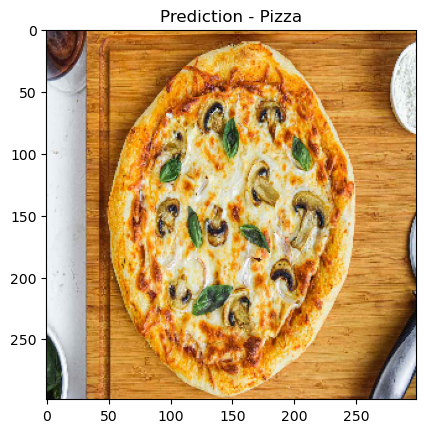

In [43]:
predict_image('C:/Users/soham/Downloads/prasad.jpg',model)

In [41]:
query = food_name

In [61]:
import requests
import json
# query = 'banana'
api_url = 'https://api.api-ninjas.com/v1/nutrition?query={}'.format(query)
response = requests.get(api_url, headers={'X-Api-Key': 'fZ7ykPHove7aFjEsSjRjKQ==Rfjj7NAyM2PIie6j'})
if response.status_code == requests.codes.ok:
    nutri_info = response.text
    print(response.text)
else:
    print("Error:", response.status_code, response.text)

[{"name": "pizza", "calories": 262.9, "serving_size_g": 100.0, "fat_total_g": 9.8, "fat_saturated_g": 4.5, "protein_g": 11.4, "sodium_mg": 587, "potassium_mg": 217, "cholesterol_mg": 16, "carbohydrates_total_g": 32.9, "fiber_g": 2.3, "sugar_g": 3.6}]


In [63]:
nutri_info = json.loads(nutri_info)

for item in nutri_info:
    if item["name"] == "pizza":
        calories = item["calories"]
        protein = item["protein_g"]
        print("Calories in a pizza:", calories)
        print("Protein in a pizza:", protein)
        break

Calories in a pizza: 262.9
Protein in a pizza: 11.4
